In [1]:
#Import libraries
import os
import pandas as pd
import numpy as np
import datetime as dt
import hvplot.pandas
import matplotlib.pyplot as plt
import plotly.express as px
from pathlib import Path
from dotenv import load_dotenv
import panel as pn
%matplotlib inline

In [2]:
load_dotenv()
map_box_api = os.getenv("mapbox")
px.set_mapbox_access_token(map_box_api)

In [3]:
#Assign paths
canada_hospitalizations_path = Path('Resources/COVID-19_Hospitalizations/Canadian_COVID-19_Hospitalizations_combined.csv')
canada_cpi_path = Path('Resources/Consumer_Price_Index/CPI_Cleaned.csv')
canada_coordinates_path = Path('Resources/Canada_coordinates.csv')

In [4]:
#Read CSV files
canada_hospitalizations_df = pd.read_csv(canada_hospitalizations_path, index_col='Date', infer_datetime_format=True, parse_dates=True)
canada_cpi_df = pd.read_csv(canada_cpi_path, index_col='Date', infer_datetime_format=True, parse_dates=True)
canada_coordinates_df = pd.read_csv(canada_coordinates_path)

In [5]:
canada_coordinates_df.set_index('GEO')

,lon,lat
GEO,,
Canada,-105.750596,55.585901
Alberta,-114.757176,54.642672
Ontario,-84.253981,49.451564
Manitoba,-98.470346,53.460486
Saskatchewan,-106.133622,53.909005
Quebec,-71.927461,50.267735


In [6]:
#Hvplot Canada Hospitalizations
canada_hospitalizations_df.hvplot.line(
    x='Date', 
    groupby=['GEO'],
    title = 'Total Canada COVID-19 Hospitalizations and Per Selected Provinces'
    )

:DynamicMap   [GEO]
   :Curve   [Date]   (Hospitalizations)

In [7]:
canada_hospitalizations_df.hvplot(
    x='Date', 
    groupby=['GEO'],
    title = 'Total Canada COVID-19 Hospitalizations and Per Selected Provinces',
    width=1000,
    height=500
    ).overlay('GEO')

:NdOverlay   [GEO]
   :Curve   [Date]   (Hospitalizations)

<AxesSubplot:>

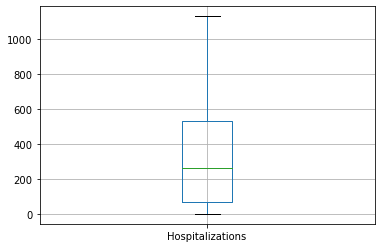

In [8]:
canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Alberta'].boxplot()

<AxesSubplot:>

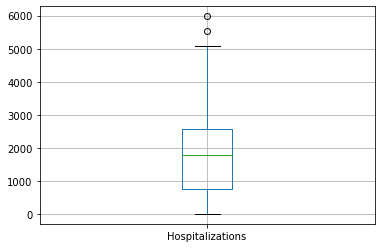

In [9]:
canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Canada'].boxplot()

<AxesSubplot:>

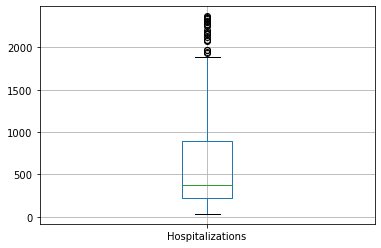

In [10]:
canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Ontario'].boxplot()

<AxesSubplot:>

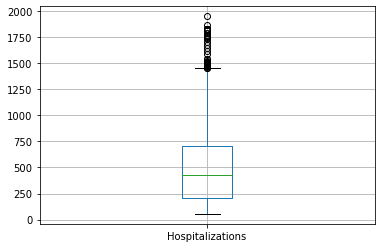

In [11]:
canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Quebec'].boxplot()

In [12]:
# canada_hospitalizations_df.reset_index(inplace=True)
# quebec_boxplot = px.box(canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Quebec'])
# quebec_boxplot

In [13]:
canada_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Canada'].describe()
alberta_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Alberta'].describe()
ontario_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Ontario'].describe()
saskatchewan_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Saskatchewan'].describe()
manitoba_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Manitoba'].describe()
quebec_summary = canada_hospitalizations_df.loc[canada_hospitalizations_df['GEO'] == 'Quebec'].describe()

In [14]:
canada_summary = canada_summary.rename(columns = {'Hospitalizations':'Canada'})
alberta_summary = alberta_summary.rename(columns = {'Hospitalizations':'Alberta'})
ontario_summary = ontario_summary.rename(columns = {'Hospitalizations':'Ontario'})
saskatchewan_summary = saskatchewan_summary.rename(columns = {'Hospitalizations':'Saskatchewan'})
manitoba_summary = manitoba_summary.rename(columns = {'Hospitalizations':'Manitoba'})
quebec_summary = quebec_summary.rename(columns = {'Hospitalizations':'Quebec'})

In [15]:
canada_summary_combined = pd.concat([canada_summary, alberta_summary, ontario_summary, manitoba_summary, saskatchewan_summary, quebec_summary], axis=1, join='inner')

In [16]:
canada_summary_combined = canada_summary_combined.transpose()

In [17]:
canada_summary_combined.index.names = ['GEO']

In [18]:
canada_summary_combined

,count,mean,std,min,25%,50%,75%,max
GEO,,,,,,,,
Canada,670.0,1868.219403,1247.283989,4.0,747.75,1772.5,2561.25,5981.0
Alberta,670.0,332.264179,302.885975,0.0,65.75,259.5,531.50,1129.0
Ontario,643.0,610.945568,537.862380,33.0,225.00,378.0,892.00,2367.0
Manitoba,666.0,83.716216,85.594334,0.0,9.00,66.5,110.00,359.0
Saskatchewan,520.0,124.155769,82.691809,1.0,59.75,125.5,180.25,348.0
Quebec,636.0,545.614780,450.174655,54.0,205.00,426.5,704.25,1953.0


In [19]:
canada_coordinates_df = canada_coordinates_df.set_index('GEO')

In [20]:
canada_coordinates_df

,lon,lat
GEO,,
Canada,-105.750596,55.585901
Alberta,-114.757176,54.642672
Ontario,-84.253981,49.451564
Manitoba,-98.470346,53.460486
Saskatchewan,-106.133622,53.909005
Quebec,-71.927461,50.267735


In [21]:
canada_summary_combined_coordinates = pd.concat([canada_summary_combined, canada_coordinates_df], axis=1, join='inner')

In [22]:
canada_summary_combined_coordinates

,count,mean,std,min,25%,50%,75%,max,lon,lat
GEO,,,,,,,,,,
Canada,670.0,1868.219403,1247.283989,4.0,747.75,1772.5,2561.25,5981.0,-105.750596,55.585901
Alberta,670.0,332.264179,302.885975,0.0,65.75,259.5,531.50,1129.0,-114.757176,54.642672
Ontario,643.0,610.945568,537.862380,33.0,225.00,378.0,892.00,2367.0,-84.253981,49.451564
Manitoba,666.0,83.716216,85.594334,0.0,9.00,66.5,110.00,359.0,-98.470346,53.460486
Saskatchewan,520.0,124.155769,82.691809,1.0,59.75,125.5,180.25,348.0,-106.133622,53.909005
Quebec,636.0,545.614780,450.174655,54.0,205.00,426.5,704.25,1953.0,-71.927461,50.267735


In [23]:
canada_summary_combined_coordinates.reset_index(inplace=True)

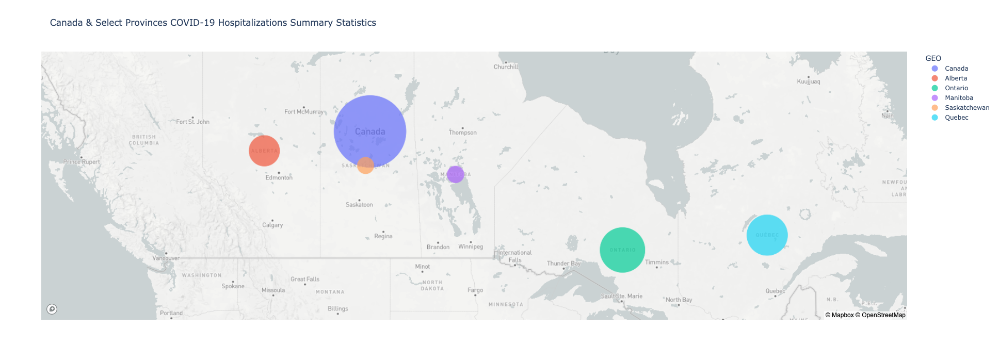

In [60]:
mapbox_canada_summary = px.scatter_mapbox(
    canada_summary_combined_coordinates, 
    lat='lat', 
    lon='lon', 
    color='GEO', 
    size='max', 
    title='Canada & Select Provinces COVID-19 Hospitalizations Summary Statistics',
    hover_data=['GEO', 'mean', 'std', 'min', '25%', '50%', '75%', 'max'],
    zoom=4,
    height=700,
    size_max=100
    )
mapbox_canada_summary.show()
#See animation_frame + animation_group for visualizing # of hospitalizations over time

In [25]:
canada_coordinates_df = canada_coordinates_df.reset_index()

In [26]:
canada_coordinates_df.head()

,GEO,lon,lat
0,Canada,-105.750596,55.585901
1,Alberta,-114.757176,54.642672
2,Ontario,-84.253981,49.451564
3,Manitoba,-98.470346,53.460486
4,Saskatchewan,-106.133622,53.909005


In [27]:
canada_hospitalizations_df = canada_hospitalizations_df.reset_index()

In [28]:
canada_hospitalizations_df.head()

,Date,GEO,Hospitalizations
0,2020-03-09,Canada,4
1,2020-03-10,Canada,5
2,2020-03-11,Canada,5
3,2020-03-12,Canada,5
4,2020-03-13,Canada,7


In [29]:
canada_hospitalizations_df['GEO'] = canada_hospitalizations_df['GEO'].astype(str)

In [30]:
canada_hospitalizations_df

,Date,GEO,Hospitalizations
0,2020-03-09,Canada,4
1,2020-03-10,Canada,5
2,2020-03-11,Canada,5
3,2020-03-12,Canada,5
4,2020-03-13,Canada,7
...,...,...,...
3800,2022-01-01,Quebec,1231
3801,2022-01-02,Quebec,1396
3802,2022-01-03,Quebec,1592
3803,2022-01-04,Quebec,1750


In [31]:
canada_hospitalizations_df.index.dtype

dtype('int64')

In [32]:
canada_hospitalizations_coordinates = canada_hospitalizations_df.merge(canada_coordinates_df, how='outer', left_on = 'GEO', right_on = 'GEO')

In [33]:
canada_hospitalizations_coordinates

,Date,GEO,Hospitalizations,lon,lat
0,2020-03-09,Canada,4,-105.750596,55.585901
1,2020-03-10,Canada,5,-105.750596,55.585901
2,2020-03-11,Canada,5,-105.750596,55.585901
3,2020-03-12,Canada,5,-105.750596,55.585901
4,2020-03-13,Canada,7,-105.750596,55.585901
...,...,...,...,...,...
3800,2022-01-01,Quebec,1231,-71.927461,50.267735
3801,2022-01-02,Quebec,1396,-71.927461,50.267735
3802,2022-01-03,Quebec,1592,-71.927461,50.267735
3803,2022-01-04,Quebec,1750,-71.927461,50.267735


In [34]:
#canada_hospitalizations_coordinates = pd.concat([canada_hospitalizations_df, canada_coordinates_df], axis=1, join='inner')

In [35]:
canada_hospitalizations_coordinates.head()

,Date,GEO,Hospitalizations,lon,lat
0,2020-03-09,Canada,4,-105.750596,55.585901
1,2020-03-10,Canada,5,-105.750596,55.585901
2,2020-03-11,Canada,5,-105.750596,55.585901
3,2020-03-12,Canada,5,-105.750596,55.585901
4,2020-03-13,Canada,7,-105.750596,55.585901


In [36]:
canada_hospitalizations_coordinates['Date'] = pd.to_datetime(canada_hospitalizations_coordinates['Date'], format = '%x')

In [37]:
canada_hospitalizations_coordinates['Date'] = canada_hospitalizations_coordinates['Date'].apply(str)

In [57]:
canada_hospitalizations_coordinates.head()

,Date,GEO,Hospitalizations,lon,lat
0,2020-03-09 00:00:00,Canada,4,-105.750596,55.585901
1,2020-03-10 00:00:00,Canada,5,-105.750596,55.585901
2,2020-03-11 00:00:00,Canada,5,-105.750596,55.585901
3,2020-03-12 00:00:00,Canada,5,-105.750596,55.585901
4,2020-03-13 00:00:00,Canada,7,-105.750596,55.585901


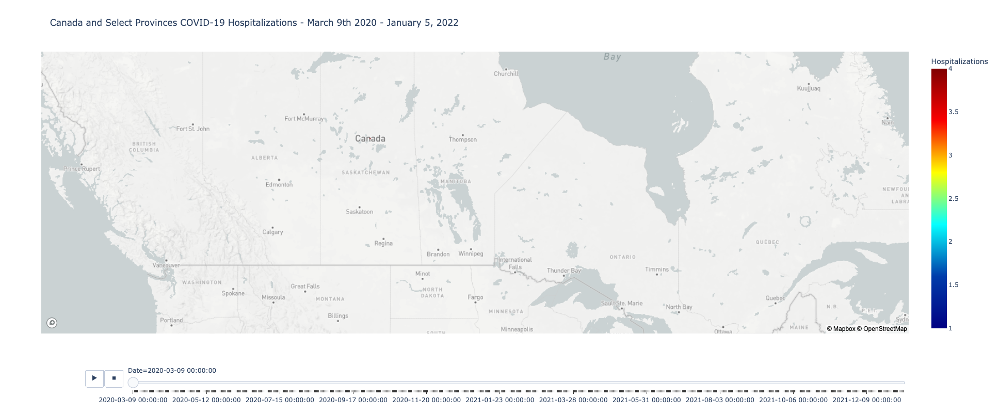

In [58]:
mapbox_hospitalizations = px.scatter_mapbox(
    canada_hospitalizations_coordinates, 
    lat='lat', 
    lon='lon', 
    color='Hospitalizations', 
    size='Hospitalizations', 
    title='Canada and Select Provinces COVID-19 Hospitalizations - March 9th, 2020 - January 5, 2022',
    color_continuous_scale=px.colors.sequential.Jet,
    hover_data=['GEO'],
    zoom=4,
    height=800,
    size_max=100,
    animation_frame='Date',
    animation_group = 'GEO'
    )
mapbox_hospitalizations.show()

In [ ]:
# canada_hospitalizations_df_plx = px.data.gapminder()
#canada_hospitalizations_df.reset_index(inplace=True)

In [ ]:
df_time = canada_hospitalizations_df.sort_values(by='Date')

In [ ]:
df_time.head()

In [ ]:
#df_time['Date'] = df_time.timestamp.apply(lambda x: x.date()).apply(str)
date_string = canada_hospitalizations_df.index.astype(str)

In [ ]:
canada_hospitalizations_df

In [ ]:
#fig = px.scatter(canada_hospitalizations_df, x=canada_hospitalizations_df.index, y='Hospitalizations', animation_frame=animation_frame, animation_group='GEO', size='Hospitalizations', color='GEO', hover_name='GEO')

In [ ]:
# canada_hospitalizations_df.reset_index(inplace=True)
# canada_hospitalizations_df_plot = px.line(
#     canada_hospitalizations_df, 
#     x='Date', 
#     y='Hospitalizations', 
#     color='Hospitalizations', 
#     facet_row=date_string, width=1000, 
#     height=1000,
#     title='COVID-19 Hospitalizations in Canada and Select Provinces'
# )

In [55]:
#Hv plot Canada CPI
canada_cpi_df.hvplot(
    x='Date', 
    y='VALUE', 
    groupby=['GEO', 'Products and product groups'],
    title = 'Canada CPI 2019-2021'
    )

:DynamicMap   [GEO,Products and product groups]
   :Curve   [Date]   (VALUE)

In [ ]:
# canada_cpi_df.reset_index()
# canada_hospitalizations_df.reset_index()

In [ ]:
#canada_cpi_covid19_combined = pd.concat(canada_hospitalizations_df, canada_cpi_df, join='outer')